# TensorFlow 教程 #14
# DeepDream

by [Magnus Erik Hvass Pedersen](http://www.hvass-labs.org/)
/ [GitHub](https://github.com/Hvass-Labs/TensorFlow-Tutorials) / [Videos on YouTube](https://www.youtube.com/playlist?list=PL9Hr9sNUjfsmEu1ZniY0XpHSzl5uihcXZ)  
中文翻译 [thrillerist](https://zhuanlan.zhihu.com/insight-pixel)  / [Github](https://github.com/thrillerist/TensorFlow-Tutorials)

## 介绍

在上一篇教程中，我们看到了如何用神经网络的梯度来生成图像。教程#11和#12展示了如何用梯度来生成对抗噪声。教程#13展示了怎么用梯度来生成神经网络内部特征所响应的图像。

本文会使用一个与之前类似的方法。现在我们会用神经网络的梯度来放大输入图像中的图案（patterns）。这个通常称为DeepDream算法，但这个技术实际上有许多不同的变体。

本文基于之前的教程。你需要大概地熟悉神经网络（详见教程 #01和 #02）。

## 流程图

下面的流程图粗略展示了DeepDream算法的想法。我们使用的是Inception模型，它的层次要比这边显示的更多。我们使用TensorFlow自动导出网络中一个给定层相对于输入图像的梯度。然后用梯度来更新输入图像。这个过程重复多次，直到出现图案并且我们对所得到的图像满意为止。

这里的原理就是，神经网络在图像中看到一些图案的痕迹，然后我们只是用梯度把它放大了。

这里没有显示DeepDream算法的一些细节，例如梯度被平滑了，后面会讨论它的一些优点。梯度也是分块计算的，因此它可以在高分辨率的图像上工作，而不会耗尽计算机内存。

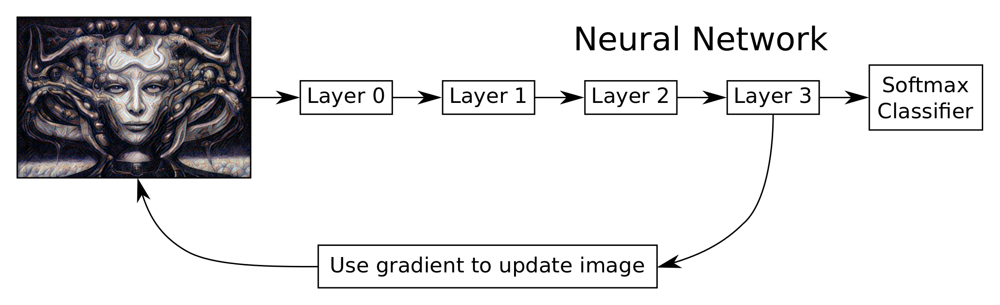

In [1]:
from IPython.display import Image, display
Image('images/14_deepdream_flowchart.png')

### 递归优化

Inception模型是在相当低分辨率的图像上进行训练的，大概200-300像素。所以，当我们使用更大分辨率的图像时，DeepDream算法会在图像中创建许多小的图案。

一个解决方案是将输入图像缩小到200-300像素。但是这么低的分辨率（的结果）是像素化而且丑陋的。

另一个解决方案是多次缩小原始图像，在每个较小的图像上运行DeepDream算法。这样会在图像中创建更大的图案，然后以更高的分辨率进行改善。

这个流程图粗略显示了这个想法。算法递归地实现并且支持任何数量的缩小级别。算法有些细节并未在这里展示，比如，图像在缩小之前会做一些模糊处理，并且原始图像只是与DeepDream图像混合在一起，来增加一些原始的细节。

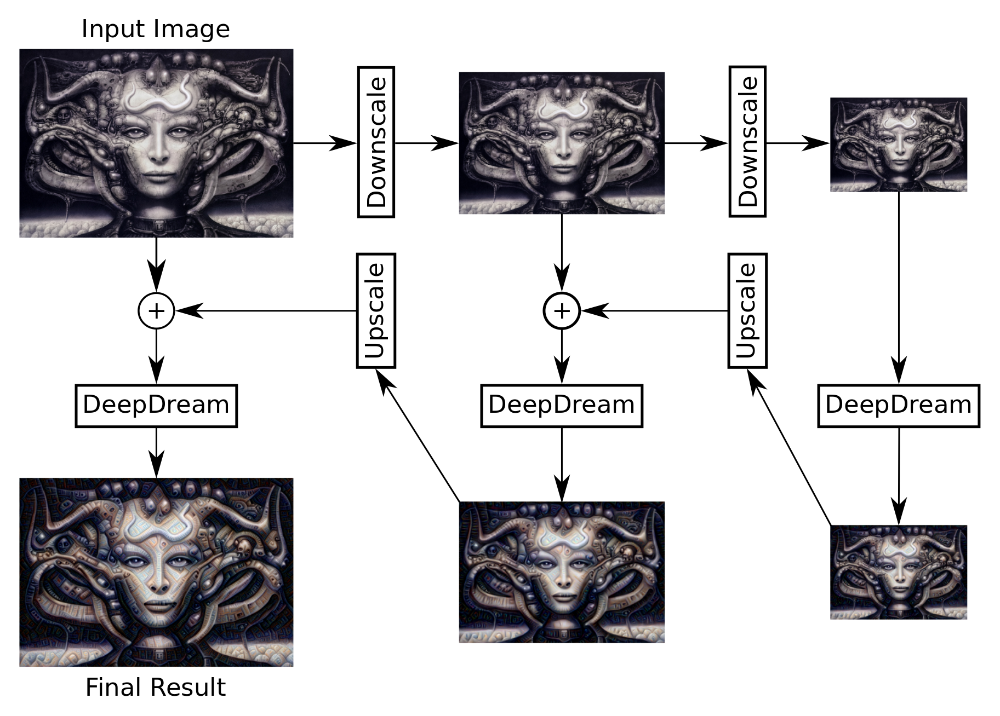

In [2]:
Image('images/14_deepdream_recursive_flowchart.png')

## 导入

In [3]:
%matplotlib inline
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
import random
import math

# Image manipulation.
import PIL.Image
from scipy.ndimage.filters import gaussian_filter

使用Python3.5.2（Anaconda）开发，TensorFlow版本是：

In [4]:
tf.__version__

'1.1.0'

## Inception 模型

前面的一些教程都使用了Inception v3模型。本文将会使用Inception模型的另一个变体。由于Google开发者并没有很好的为其撰写文档（跟通常一样），不太清楚模型是哪个版本。我们在这里用“Inception 5h”来指代它，因为zip包的文件名就是这样，尽管看起来这是Inception模型的一个早期的、更简单的版本。

这里使用Inception 5h模型是因为它更容易使用：它接受任何尺寸的输入图像，然后创建比Inception v3模型（见教程 #13）更漂亮的图像。

In [5]:
import inception5h

从网上下载Inception 5h模型。这是你保存数据文件的默认文件夹。如果文件夹不存在就自动创建。

In [6]:
# inception.data_dir = 'inception/5h/'

如果文件夹中不存在Inception模型，就自动下载。
它有50MB。

In [7]:
inception5h.maybe_download()

Data has apparently already been downloaded and unpacked.


载入模型，以便使用。

In [8]:
model = inception5h.Inception5h()

Inception 5h模型有许多层可用来做DeepDreaming。我们列出了12个最常用的层，以供参考。

In [9]:
len(model.layer_tensors)

12

## 操作图像的帮助函数

这个函数载入一张图像，并返回一个浮点型numpy数组。

In [10]:
def load_image(filename):
    image = PIL.Image.open(filename)

    return np.float32(image)

将图像保存成jpeg文件。图像是保存着0-255像素的numpy数组。

In [11]:
def save_image(image, filename):
    # Ensure the pixel-values are between 0 and 255.
    image = np.clip(image, 0.0, 255.0)
    
    # Convert to bytes.
    image = image.astype(np.uint8)
    
    # Write the image-file in jpeg-format.
    with open(filename, 'wb') as file:
        PIL.Image.fromarray(image).save(file, 'jpeg')

这是绘制图像的函数。使用matplotlib将得到低分辨率的图像。使用PIL效果比较好。

In [12]:
def plot_image(image):
    # Assume the pixel-values are scaled between 0 and 255.
    
    if False:
        # Convert the pixel-values to the range between 0.0 and 1.0
        image = np.clip(image/255.0, 0.0, 1.0)
        
        # Plot using matplotlib.
        plt.imshow(image, interpolation='lanczos')
        plt.show()
    else:
        # Ensure the pixel-values are between 0 and 255.
        image = np.clip(image, 0.0, 255.0)
        
        # Convert pixels to bytes.
        image = image.astype(np.uint8)

        # Convert to a PIL-image and display it.
        display(PIL.Image.fromarray(image))

归一化图像，则像素值在0.0到1.0之间。这个在绘制梯度时很有用。

In [13]:
def normalize_image(x):
    # Get the min and max values for all pixels in the input.
    x_min = x.min()
    x_max = x.max()

    # Normalize so all values are between 0.0 and 1.0
    x_norm = (x - x_min) / (x_max - x_min)
    
    return x_norm

对梯度做归一化之后，用这个函数绘制。

In [14]:
def plot_gradient(gradient):
    # Normalize the gradient so it is between 0.0 and 1.0
    gradient_normalized = normalize_image(gradient)
    
    # Plot the normalized gradient.
    plt.imshow(gradient_normalized, interpolation='bilinear')
    plt.show()

这个函数调整图像的大小。函数的参数是你指定的具体的图像分辨率，比如(100，200)，它也可以接受一个缩放因子，比如，参数是0.5时,图像每个维度缩小一半。

这个函数用PIL来实现，代码有点长，因为我们用numpy数组来处理图像，其中像素值是浮点值。PIL不支持这个，因此需要将图像转换成8位字节，来确保像素值在合适的范围内。然后，图像被调整大小并转换回浮点值。

In [15]:
def resize_image(image, size=None, factor=None):
    # If a rescaling-factor is provided then use it.
    if factor is not None:
        # Scale the numpy array's shape for height and width.
        size = np.array(image.shape[0:2]) * factor
        
        # The size is floating-point because it was scaled.
        # PIL requires the size to be integers.
        size = size.astype(int)
    else:
        # Ensure the size has length 2.
        size = size[0:2]
    
    # The height and width is reversed in numpy vs. PIL.
    size = tuple(reversed(size))

    # Ensure the pixel-values are between 0 and 255.
    img = np.clip(image, 0.0, 255.0)
    
    # Convert the pixels to 8-bit bytes.
    img = img.astype(np.uint8)
    
    # Create PIL-object from numpy array.
    img = PIL.Image.fromarray(img)
    
    # Resize the image.
    img_resized = img.resize(size, PIL.Image.LANCZOS)
    
    # Convert 8-bit pixel values back to floating-point.
    img_resized = np.float32(img_resized)

    return img_resized

## DeepDream 算法

### 梯度

下面的帮助函数计算了在DeepDream中使用的输入图像的梯度。Inception 5h模型可以接受任意尺寸的图像，但太大的图像可能会占用千兆字节的内存。为了使内存占用最低，我们将输入图像分割成小的图块，然后计算每小块的梯度。

然而，这可能会在DeepDream算法最终生成的图像中产生肉眼可见的线条。因此我们随机地挑选小块，这样它们的位置就是不同的。这使得在最终的DeepDream图像里，小块之间的缝隙不可见。

这个帮助函数用来确定合适的图块尺寸。比如，期望的图块尺寸为400x400像素，但实际大小取决于图像尺寸。

In [16]:
def get_tile_size(num_pixels, tile_size=400):
    """
    num_pixels is the number of pixels in a dimension of the image.
    tile_size is the desired tile-size.
    """

    # How many times can we repeat a tile of the desired size.
    num_tiles = int(round(num_pixels / tile_size))
    
    # Ensure that there is at least 1 tile.
    num_tiles = max(1, num_tiles)
    
    # The actual tile-size.
    actual_tile_size = math.ceil(num_pixels / num_tiles)
    
    return actual_tile_size

这个帮助函数计算了输入图像的梯度。图像被分割成小块，然后分别计算各个图块的梯度。图块是随机选择的，避免在最终的DeepDream图像内产生可见的缝隙。

In [17]:
def tiled_gradient(gradient, image, tile_size=400):
    # Allocate an array for the gradient of the entire image.
    grad = np.zeros_like(image)

    # Number of pixels for the x- and y-axes.
    x_max, y_max, _ = image.shape

    # Tile-size for the x-axis.
    x_tile_size = get_tile_size(num_pixels=x_max, tile_size=tile_size)
    # 1/4 of the tile-size.
    x_tile_size4 = x_tile_size // 4

    # Tile-size for the y-axis.
    y_tile_size = get_tile_size(num_pixels=y_max, tile_size=tile_size)
    # 1/4 of the tile-size
    y_tile_size4 = y_tile_size // 4

    # Random start-position for the tiles on the x-axis.
    # The random value is between -3/4 and -1/4 of the tile-size.
    # This is so the border-tiles are at least 1/4 of the tile-size,
    # otherwise the tiles may be too small which creates noisy gradients.
    x_start = random.randint(-3*x_tile_size4, -x_tile_size4)

    while x_start < x_max:
        # End-position for the current tile.
        x_end = x_start + x_tile_size
        
        # Ensure the tile's start- and end-positions are valid.
        x_start_lim = max(x_start, 0)
        x_end_lim = min(x_end, x_max)

        # Random start-position for the tiles on the y-axis.
        # The random value is between -3/4 and -1/4 of the tile-size.
        y_start = random.randint(-3*y_tile_size4, -y_tile_size4)

        while y_start < y_max:
            # End-position for the current tile.
            y_end = y_start + y_tile_size

            # Ensure the tile's start- and end-positions are valid.
            y_start_lim = max(y_start, 0)
            y_end_lim = min(y_end, y_max)

            # Get the image-tile.
            img_tile = image[x_start_lim:x_end_lim,
                             y_start_lim:y_end_lim, :]

            # Create a feed-dict with the image-tile.
            feed_dict = model.create_feed_dict(image=img_tile)

            # Use TensorFlow to calculate the gradient-value.
            g = session.run(gradient, feed_dict=feed_dict)

            # Normalize the gradient for the tile. This is
            # necessary because the tiles may have very different
            # values. Normalizing gives a more coherent gradient.
            g /= (np.std(g) + 1e-8)

            # Store the tile's gradient at the appropriate location.
            grad[x_start_lim:x_end_lim,
                 y_start_lim:y_end_lim, :] = g
            
            # Advance the start-position for the y-axis.
            y_start = y_end

        # Advance the start-position for the x-axis.
        x_start = x_end

    return grad

### 优化图像

这个函数是DeepDream算法的主要优化循环。它根据输入图像计算Inception模型中给定层的梯度。然后将梯度添加到输入图像，从而增加层张量(layer-tensor)的平均值。多次重复这个过程，并放大Inception模型在输入图像中看到的任何图案。

In [18]:
def optimize_image(layer_tensor, image,
                   num_iterations=10, step_size=3.0, tile_size=400,
                   show_gradient=False):
    """
    Use gradient ascent to optimize an image so it maximizes the
    mean value of the given layer_tensor.
    
    Parameters:
    layer_tensor: Reference to a tensor that will be maximized.
    image: Input image used as the starting point.
    num_iterations: Number of optimization iterations to perform.
    step_size: Scale for each step of the gradient ascent.
    tile_size: Size of the tiles when calculating the gradient.
    show_gradient: Plot the gradient in each iteration.
    """

    # Copy the image so we don't overwrite the original image.
    img = image.copy()
    
    print("Image before:")
    plot_image(img)

    print("Processing image: ", end="")

    # Use TensorFlow to get the mathematical function for the
    # gradient of the given layer-tensor with regard to the
    # input image. This may cause TensorFlow to add the same
    # math-expressions to the graph each time this function is called.
    # It may use a lot of RAM and could be moved outside the function.
    gradient = model.get_gradient(layer_tensor)
    
    for i in range(num_iterations):
        # Calculate the value of the gradient.
        # This tells us how to change the image so as to
        # maximize the mean of the given layer-tensor.
        grad = tiled_gradient(gradient=gradient, image=img)
        
        # Blur the gradient with different amounts and add
        # them together. The blur amount is also increased
        # during the optimization. This was found to give
        # nice, smooth images. You can try and change the formulas.
        # The blur-amount is called sigma (0=no blur, 1=low blur, etc.)
        # We could call gaussian_filter(grad, sigma=(sigma, sigma, 0.0))
        # which would not blur the colour-channel. This tends to
        # give psychadelic / pastel colours in the resulting images.
        # When the colour-channel is also blurred the colours of the
        # input image are mostly retained in the output image.
        sigma = (i * 4.0) / num_iterations + 0.5
        grad_smooth1 = gaussian_filter(grad, sigma=sigma)
        grad_smooth2 = gaussian_filter(grad, sigma=sigma*2)
        grad_smooth3 = gaussian_filter(grad, sigma=sigma*0.5)
        grad = (grad_smooth1 + grad_smooth2 + grad_smooth3)

        # Scale the step-size according to the gradient-values.
        # This may not be necessary because the tiled-gradient
        # is already normalized.
        step_size_scaled = step_size / (np.std(grad) + 1e-8)

        # Update the image by following the gradient.
        img += grad * step_size_scaled

        if show_gradient:
            # Print statistics for the gradient.
            msg = "Gradient min: {0:>9.6f}, max: {1:>9.6f}, stepsize: {2:>9.2f}"
            print(msg.format(grad.min(), grad.max(), step_size_scaled))

            # Plot the gradient.
            plot_gradient(grad)
        else:
            # Otherwise show a little progress-indicator.
            print(". ", end="")

    print()
    print("Image after:")
    plot_image(img)
    
    return img

### 图像递归优化

Inception模型在相当小的图像上进行训练。不清楚图像的确切大小，但可能每个维度200-300像素。如果我们使用较大的图像，比如1920x1080像素，那么上面的`optimize_image()`函数会在图像上添加很多小的图案。

这个帮助函数将输入图像多次缩放，然后用每个缩放图像来执行上面的`optimize_image()`函数。这在最终的图像中生成较大的图案。它也能加快计算速度。

In [19]:
def recursive_optimize(layer_tensor, image,
                       num_repeats=4, rescale_factor=0.7, blend=0.2,
                       num_iterations=10, step_size=3.0,
                       tile_size=400):
    """
    Recursively blur and downscale the input image.
    Each downscaled image is run through the optimize_image()
    function to amplify the patterns that the Inception model sees.

    Parameters:
    image: Input image used as the starting point.
    rescale_factor: Downscaling factor for the image.
    num_repeats: Number of times to downscale the image.
    blend: Factor for blending the original and processed images.

    Parameters passed to optimize_image():
    layer_tensor: Reference to a tensor that will be maximized.
    num_iterations: Number of optimization iterations to perform.
    step_size: Scale for each step of the gradient ascent.
    tile_size: Size of the tiles when calculating the gradient.
    """

    # Do a recursive step?
    if num_repeats>0:
        # Blur the input image to prevent artifacts when downscaling.
        # The blur amount is controlled by sigma. Note that the
        # colour-channel is not blurred as it would make the image gray.
        sigma = 0.5
        img_blur = gaussian_filter(image, sigma=(sigma, sigma, 0.0))

        # Downscale the image.
        img_downscaled = resize_image(image=img_blur,
                                      factor=rescale_factor)
            
        # Recursive call to this function.
        # Subtract one from num_repeats and use the downscaled image.
        img_result = recursive_optimize(layer_tensor=layer_tensor,
                                        image=img_downscaled,
                                        num_repeats=num_repeats-1,
                                        rescale_factor=rescale_factor,
                                        blend=blend,
                                        num_iterations=num_iterations,
                                        step_size=step_size,
                                        tile_size=tile_size)
        
        # Upscale the resulting image back to its original size.
        img_upscaled = resize_image(image=img_result, size=image.shape)

        # Blend the original and processed images.
        image = blend * image + (1.0 - blend) * img_upscaled

    print("Recursive level:", num_repeats)

    # Process the image using the DeepDream algorithm.
    img_result = optimize_image(layer_tensor=layer_tensor,
                                image=image,
                                num_iterations=num_iterations,
                                step_size=step_size,
                                tile_size=tile_size)
    
    return img_result

## TensorFlow 会话

我们需要一个TensorFlow会话来运行图。这是一个交互式的会话，因此我们可以继续往计算图中添加梯度方程。

In [20]:
session = tf.InteractiveSession(graph=model.graph)

## Hulk

在第一个例子中，我们有一张绿巨人的图像。注意看看DeepDream图像是如何保留绝大部分原始图像颜色的。这是由于梯度在其颜色通道中被平滑处理了，因此变得有点像灰阶的，主要改变图像的形状，而不改变其颜色。

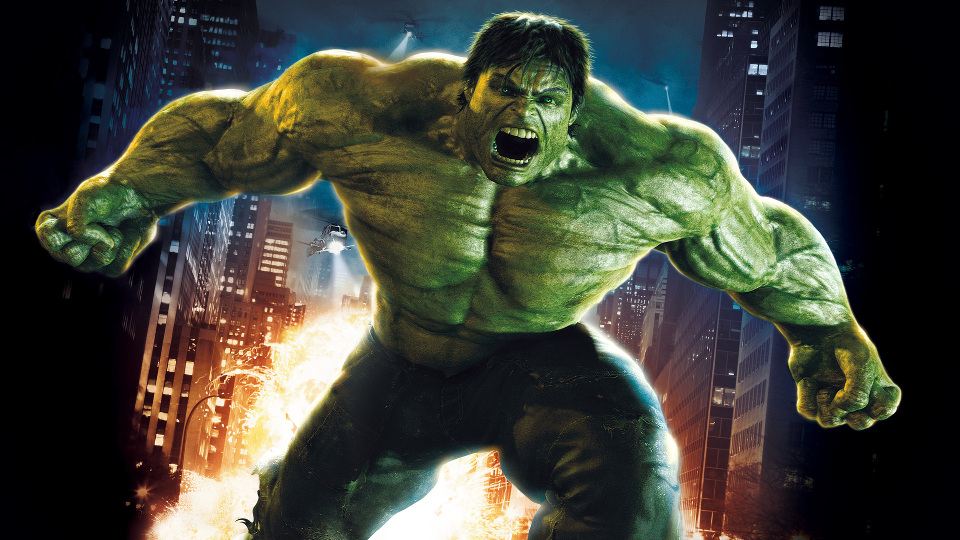

In [21]:
image = load_image(filename='images/hulk.jpg')
plot_image(image)

首先，我们需要Inception模型中的张量的引用，它将在DeepDream优化算法中被最大化。在这个例子中，我们选择Inception模型的第3层（层索引2）。它有192个通道，我们将尝试最大化这些通道的平均值。

In [22]:
layer_tensor = model.layer_tensors[2]
layer_tensor

<tf.Tensor 'conv2d2:0' shape=(?, ?, ?, 192) dtype=float32>

现在运行DeepDream优化算法，总共10次迭代，步长为6.0，这是下面递归优化的两倍。每次迭代我们都展示它的梯度，你可以看到图像方块之间的痕迹。

Image before:


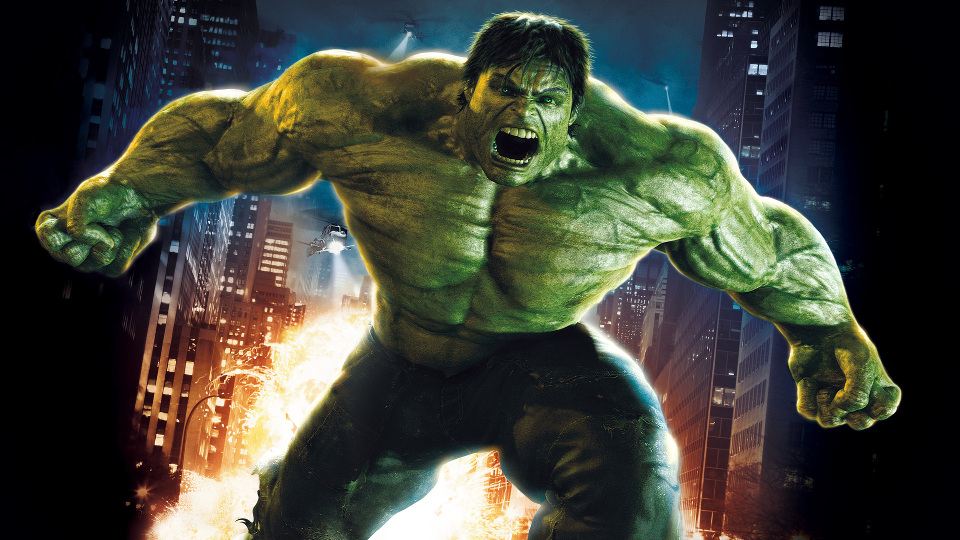

Processing image: Gradient min: -26.993517, max: 25.577057, stepsize:      3.35


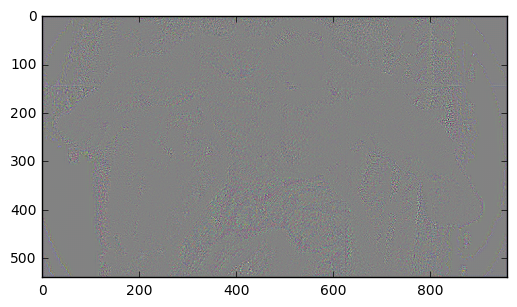

Gradient min: -15.383774, max: 12.962121, stepsize:      5.97


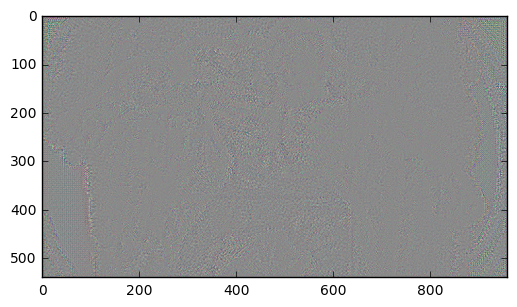

Gradient min: -5.993865, max:  6.191866, stepsize:     10.42


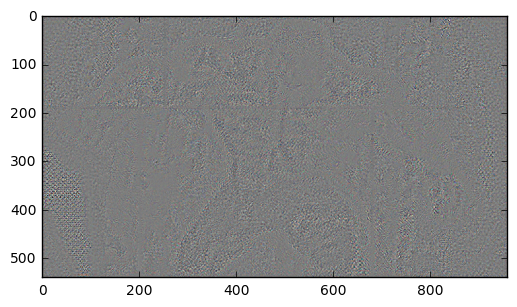

Gradient min: -3.638639, max:  3.307561, stepsize:     15.68


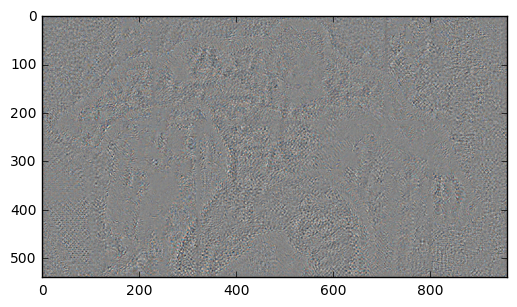

Gradient min: -2.407669, max:  2.166253, stepsize:     22.57


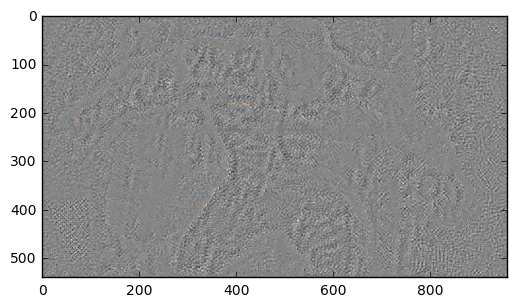

Gradient min: -1.716694, max:  1.467488, stepsize:     29.86


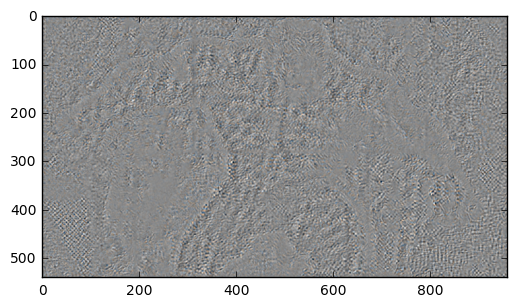

Gradient min: -1.153857, max:  1.025310, stepsize:     38.37


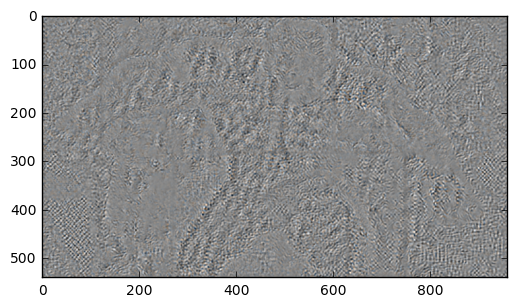

Gradient min: -1.026255, max:  0.869002, stepsize:     48.34


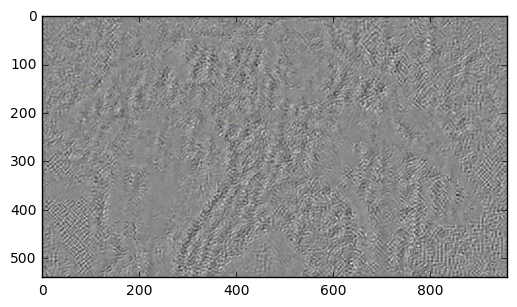

Gradient min: -0.634610, max:  0.765562, stepsize:     63.08


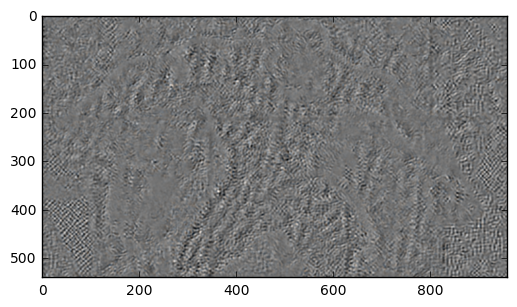

Gradient min: -0.585900, max:  0.485299, stepsize:     83.16


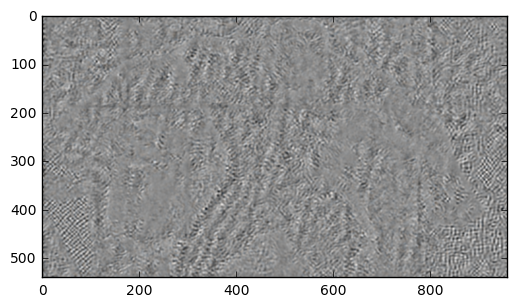


Image after:


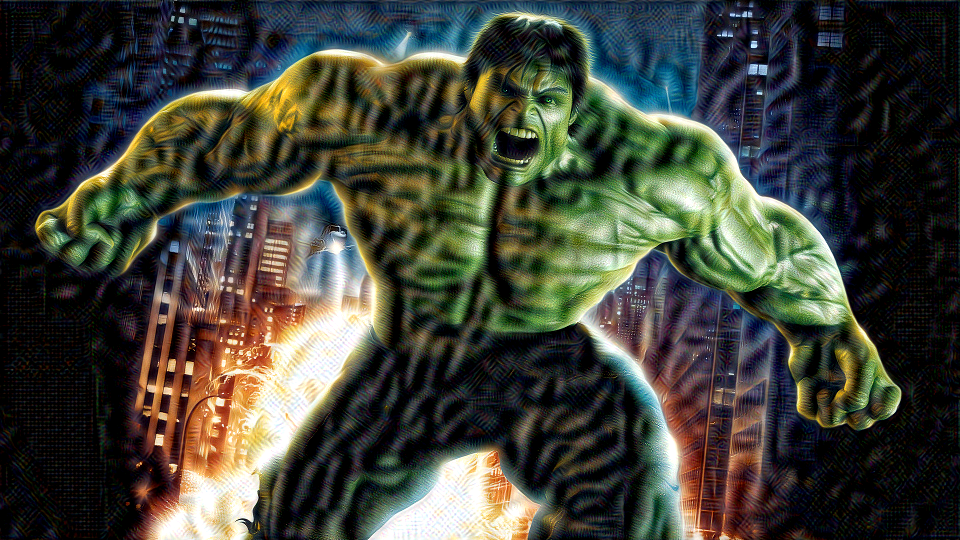

In [23]:
img_result = optimize_image(layer_tensor, image,
                   num_iterations=10, step_size=6.0, tile_size=400,
                   show_gradient=True)

如果你愿意的话，可以保存DeepDream图像。

In [24]:
# save_image(img_result, filename='deepdream_hulk.jpg')

现在，递归调用DeepDream算法。我们执行5个递归（`num_repeats + 1`），每个步骤中图像都被模糊并缩小，然后在缩小图像上运行DeepDream算法。接着，在每个步骤中，将产生的DeepDream图像与原始图像混合，从原始图像获取一点细节。这个过程重复了多次。

注意，现在DeepDream的图案更大了。这是因为我们先在低分辨率图像上创建图案，然后在较高分辨率图像上进行细化。

Recursive level: 0
Image before:


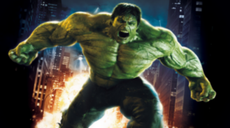

Processing image: . . . . . . . . . . 
Image after:


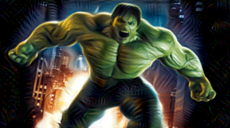

Recursive level: 1
Image before:


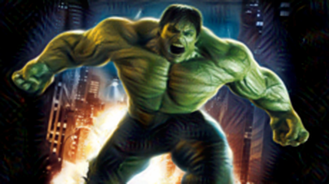

Processing image: . . . . . . . . . . 
Image after:


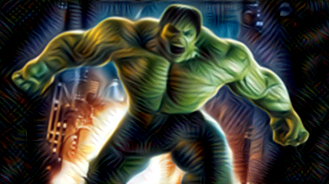

Recursive level: 2
Image before:


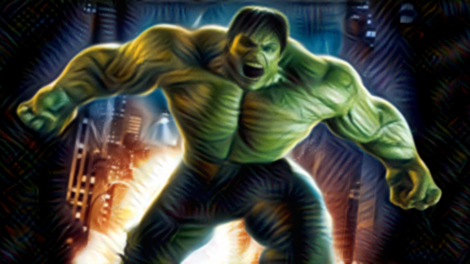

Processing image: . . . . . . . . . . 
Image after:


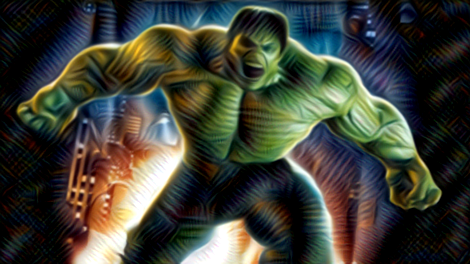

Recursive level: 3
Image before:


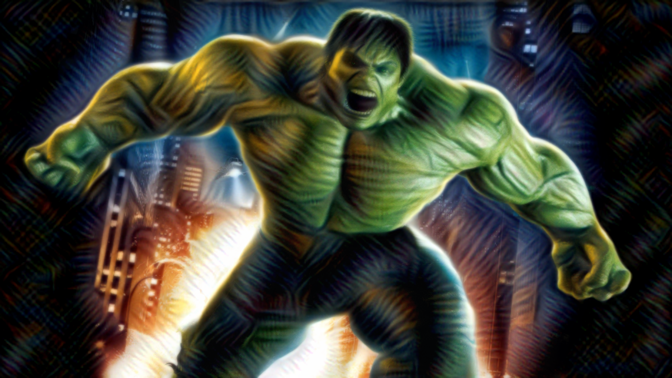

Processing image: . . . . . . . . . . 
Image after:


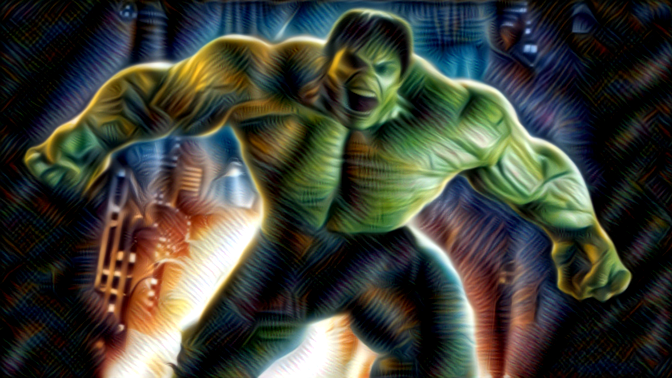

Recursive level: 4
Image before:


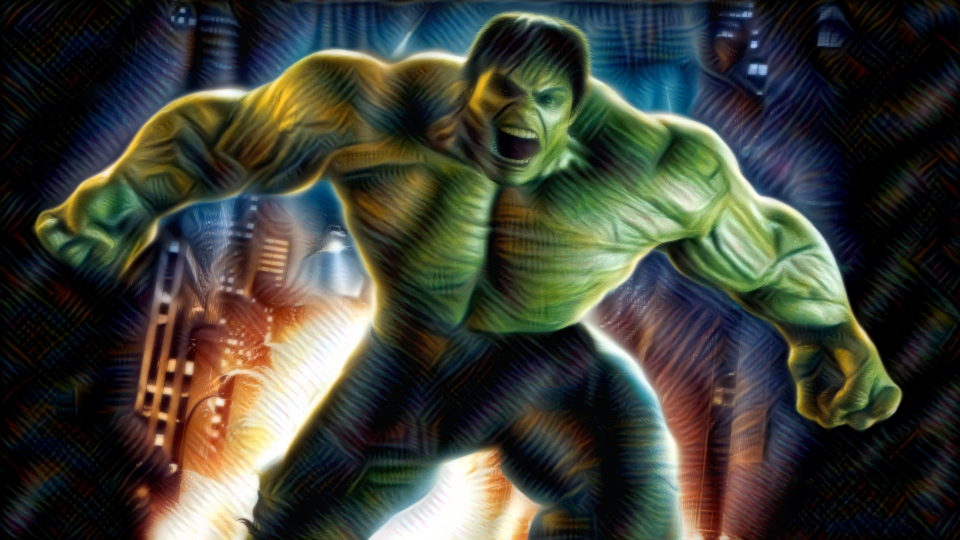

Processing image: . . . . . . . . . . 
Image after:


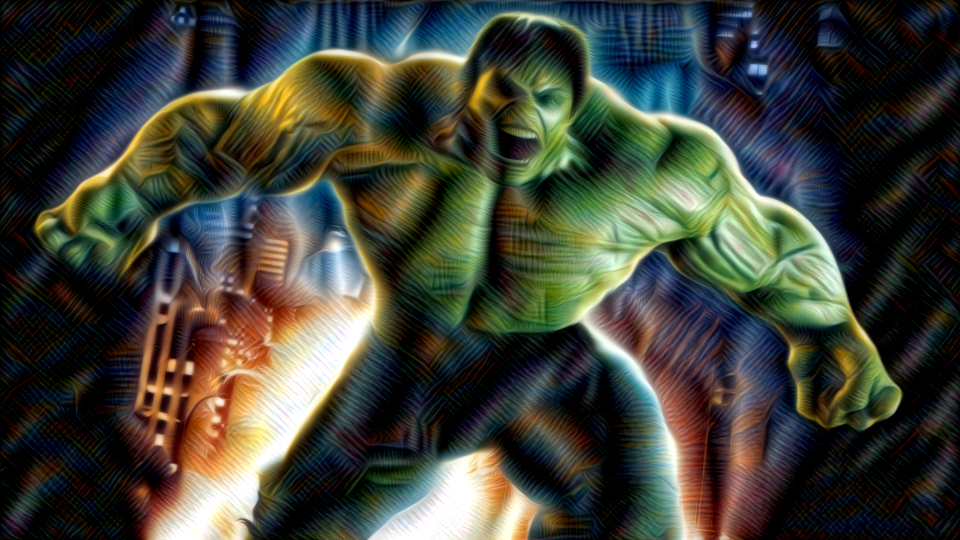

In [25]:
img_result = recursive_optimize(layer_tensor=layer_tensor, image=image,
                 num_iterations=10, step_size=3.0, rescale_factor=0.7,
                 num_repeats=4, blend=0.2)

现在我们将最大化Inception模型中的较高层。使用7号层（索引6）为例。该层识别输入图像中更复杂的形状，所以DeepDream算法也将产生更复杂的图像。这一层似乎识别了狗的脸和毛发，因此DeepDream算法往图像中添加了这些东西。

再次注意，与DeepDream算法其他变体不同的是，这里输入图像的大部分颜色被保留了下来，创建了更多柔和的颜色。这是因为我们在颜色通道中平滑了梯度，使其变得有点像灰阶，因此不会太多地改变输入图像的颜色。

In [ ]:
layer_tensor = model.layer_tensors[6]
img_result = recursive_optimize(layer_tensor=layer_tensor, image=image,
                 num_iterations=10, step_size=3.0, rescale_factor=0.7,
                 num_repeats=4, blend=0.2)

下面这个例子用DeepDream算法来最大化层的特征通道的子集。此时层的索引为7，并且只有前3个特征通道被最大化。

In [ ]:
layer_tensor = model.layer_tensors[7][:,:,:,0:3]
img_result = recursive_optimize(layer_tensor=layer_tensor, image=image,
                 num_iterations=10, step_size=3.0, rescale_factor=0.7,
                 num_repeats=4, blend=0.2)

这个例子展示了最大化Inception模型最后一层的第一个特征通道的结果。不太清楚这一层及这个特征可能会在输入图像中识别出什么来。  

（译者注：原文的`num_repeates`参数设为4，我在配有NVIDIA GT 650M的笔记本上运行程序时，会出现内存不足的情况。因此，下面将`num_repeates`设为3，需要的话可以自己改回来。）


In [ ]:
layer_tensor = model.layer_tensors[11][:,:,:,0]
img_result = recursive_optimize(layer_tensor=layer_tensor, image=image,
                 num_iterations=10, step_size=3.0, rescale_factor=0.7,
                 num_repeats=3, blend=0.2)

## Giger

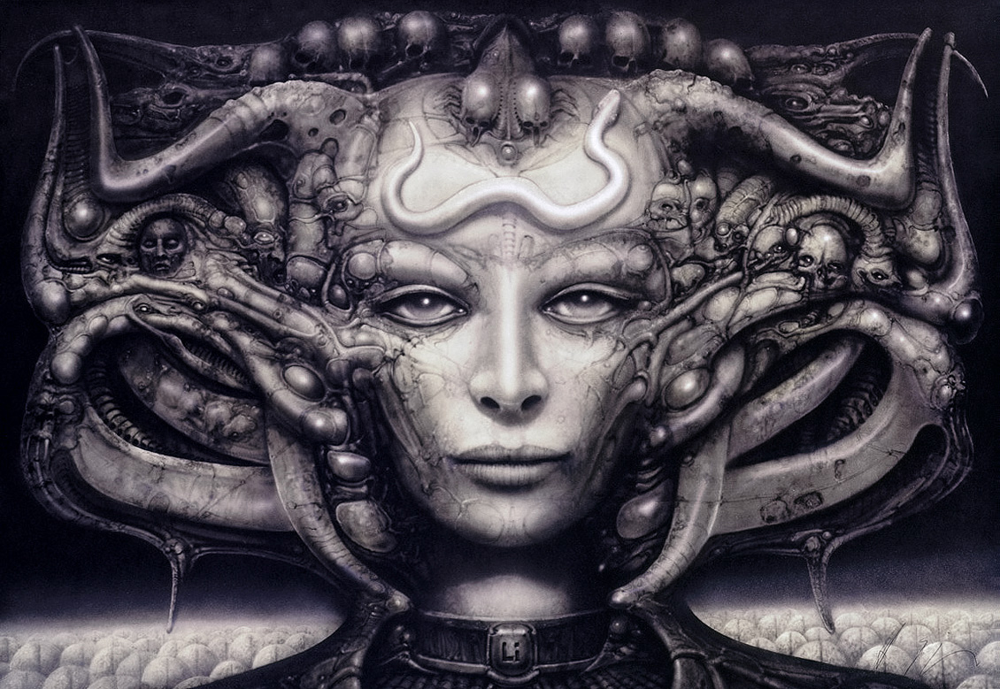

In [26]:
image = load_image(filename='images/giger.jpg')
plot_image(image)

In [ ]:
layer_tensor = model.layer_tensors[3]
img_result = recursive_optimize(layer_tensor=layer_tensor, image=image,
                 num_iterations=10, step_size=3.0, rescale_factor=0.7,
                 num_repeats=3, blend=0.2)

In [ ]:
layer_tensor = model.layer_tensors[5]
img_result = recursive_optimize(layer_tensor=layer_tensor, image=image,
                 num_iterations=10, step_size=3.0, rescale_factor=0.7,
                 num_repeats=3, blend=0.2)

## Escher

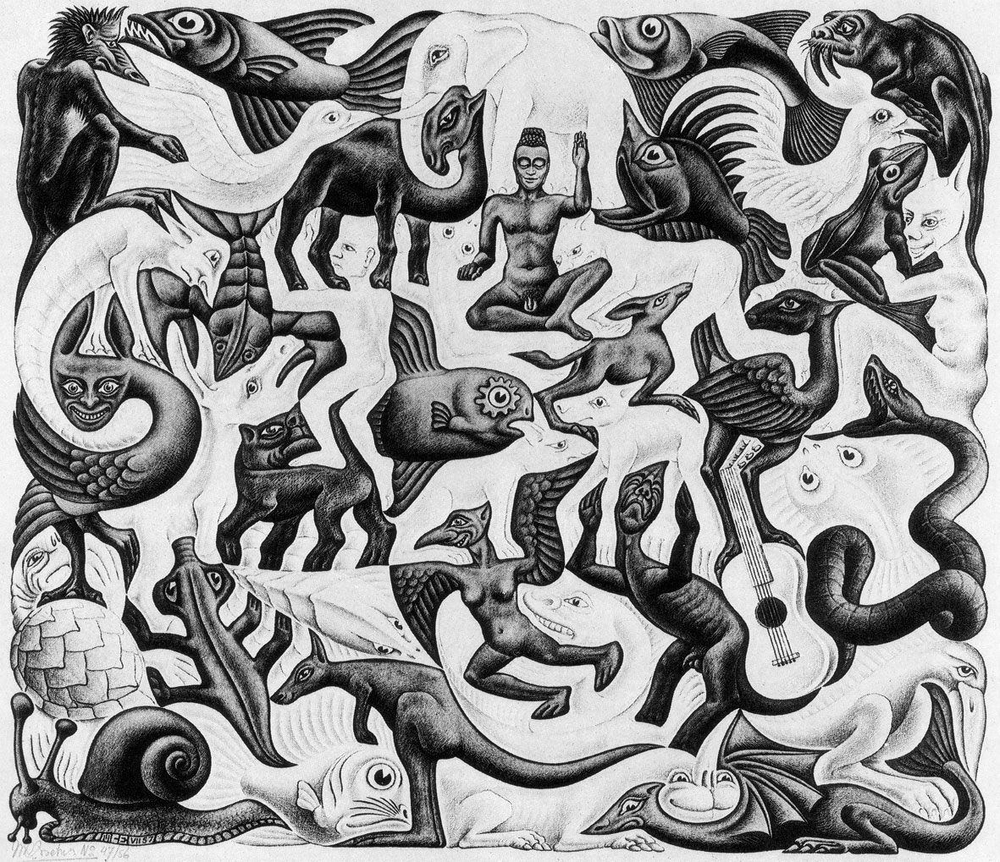

In [27]:
image = load_image(filename='images/escher_planefilling2.jpg')
plot_image(image)

In [ ]:
layer_tensor = model.layer_tensors[6]
img_result = recursive_optimize(layer_tensor=layer_tensor, image=image,
                 num_iterations=10, step_size=3.0, rescale_factor=0.7,
                 num_repeats=3, blend=0.2)

## 关闭TensorFlow会话

现在我们已经用TensorFlow完成了任务，关闭session，释放资源。

In [ ]:
# This has been commented out in case you want to modify and experiment
# with the Notebook without having to restart it.
# session.close()

## 总结

这篇教程展示了如何使用神经网络的梯度来放大图像中的图案。输出图像似乎已经用抽象的或类似动物的图案来重新绘制了。

还有许多这种技术的变体，来生成不同的输出图像。我们鼓励你修改上述参数和算法进行实验。


## 练习

下面使一些可能会让你提升TensorFlow技能的一些建议练习。为了学习如何更合适地使用TensorFlow，实践经验是很重要的。

在你对这个Notebook进行修改之前，可能需要先备份一下。


* 尝试使用自己的图像。
* 试试`optimize_image()`和`recursive_optimize()`的不同参数，看看它如何影响结果。
* 试着去掉`optimize_image()`中的梯度。会发生什么？
* 在运行`optimize_image()`时绘制梯度。会看到一些失真吗？你认为是什么原因？这重要吗？你能找到一种方法来去掉它们吗？
* 尝试使用随机噪声作为输入图像。这与教程＃13中用于可视化分析的类似。会生成比本教程中更好的图像吗？为什么？
* 在`inception5h.py`这个文件的`Inception5h.get_gradient()`里，删除`tf.square()`。 DeepDream图像会发生什么变化？为什么？
* 你可以将梯度移到`optimize_image()`外面以节省内存吗？
* 你能使程序运行得更快吗？一个想法是直接在TensorFlow中实现高斯模糊和调整大小。
* 通过重复调用`optimize_image()`并在图像上放大一点，制作一个DeepDream电影。
* 逐帧处理电影。您可能需要在帧间保持稳定。
* 向朋友解释程序如何工作。

## License (MIT)

Copyright (c) 2016 by [Magnus Erik Hvass Pedersen](http://www.hvass-labs.org/)

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.